# IMAGENET DATASET TRAINED ON RESNET ARCHITECTURE

<img src="https://i2.wp.com/www.adeveloperdiary.com/wp-content/uploads/2019/09/How-to-prepare-Imagenet-dataset-for-Image-Classification-adeveloperdiary.com-7.jpg?resize=700%2C300&ssl=1" width='700' height='500' />

## Description:
***In this project the Imagenet dataset used in Imagenet challenge with 100 classes is trained and tested using one of the recently most accurate architecture *ResNet152V2* architecture in different ways.Project is diveded into 4 sections:***

 **1. Import libraries and download dataset**
 
 **2. Preprocess data**
 
 **3. Train model**
 
 **4. Test annd deployment**
 

## In this challenge I will use Resnet 50 model to train the dataset in three ways. 

  **1. Just importing the model and directly train it** 
  
  **2. Importing model and preprocess it by transfer-learning**
  
  **3. Import model andf using fine-tuning the model**

### Section 1

In [3]:
!pip install tqdm


[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [4]:
!pip install seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 2.4 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [5]:
import tensorflow as tf 
from tensorflow.keras.applications import ResNet50 
import numpy as np
import tensorflow_datasets as tfds
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import random
from glob import glob
from keras.models import *
from keras.layers import *
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array,array_to_img
from IPython.display import display
from PIL import Image

In [6]:
mapping_path = '/kaggle/input/imagenet-object-localization-challenge/LOC_synset_mapping.txt'

# Creating of mapping dictionaries to get the image classes

class_mapping_dict = {}
class_mapping_dict_number = {}
mapping_class_to_number = {}
mapping_number_to_class = {}
i = 0
for line in open(mapping_path):
    class_mapping_dict[line[:9].strip()] = line[9:].strip()
    class_mapping_dict_number[i] = line[9:].strip()
    mapping_class_to_number[line[:9].strip()] = i
    mapping_number_to_class[i] = line[:9].strip()
    i+=1
train_path = '/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train'

# Creation of dataset_array and true_classes

dataset_array = []
true_classes = []
images_array = []
for train_class in tqdm(os.listdir(train_path)):
    i = 0
    for el in os.listdir(train_path + '/' + train_class):
        if i < 10:
            path = train_path + '/' + train_class + '/' + el
            image = load_img(path,target_size=(224,224,3))
            image_array = img_to_array(image).astype(np.uint8)
            images_array.append(image_array)
            true_class = class_mapping_dict[path.split('/')[-2]]
            true_classes.append(true_class)
            i+=1
        else:
            break
images_array = np.array(images_array)
true_classes = np.array(true_classes)
print('Preprocessing in progress')
dataset_array = preprocess_input(images_array)
print('FINISH')

100%|██████████| 1000/1000 [06:51<00:00,  2.43it/s]


Preprocessing in progress
FINISH


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


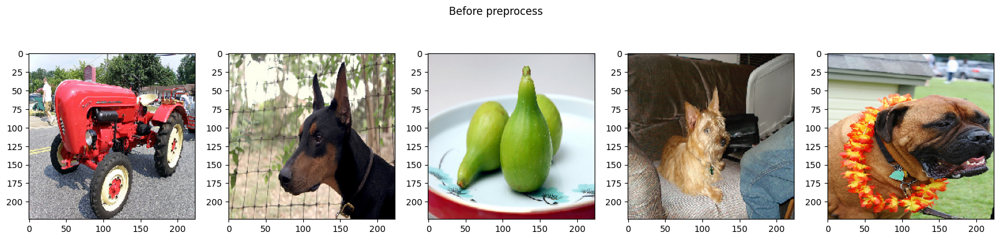

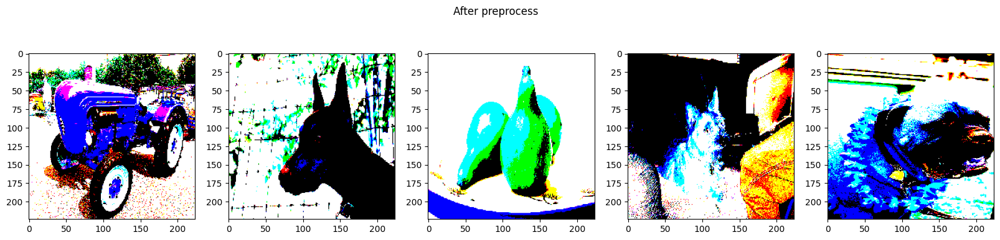

In [7]:
rand_indices = random.sample(range(0, 1000),5)
plt.figure(figsize=(20, 20))
plt.suptitle('Before preprocess',x = 0.5,y = 0.6)
for i in range(5):
    ax = plt.subplot(1,5,i+1)
    ax.imshow(images_array[rand_indices[i]])
plt.figure(figsize=(20, 20))
plt.suptitle('After preprocess',x = 0.5,y = 0.6)
for i in range(5):
    ax = plt.subplot(1,5,i+1)
    ax.imshow(dataset_array[rand_indices[i]])

# Model building

# 1.Original ResNet50 from the scratch 
**ResNet-50** is a convolutional neural network (CNN) architecture that is part of the **ResNet** (*Residual Network*) family, developed by Microsoft Research. It is known for its deep structure and effectiveness in image recognition tasks, particularly in the context of the **ImageNet Large Scale Visual Recognition Challenge (ILSVRC)**.

Here's a brief overview of the ResNet-50 architecture:

Input Layer: Accepts input images typically of size 224x224 pixels.

Convolutional Layers: The network begins with a series of convolutional layers that extract features from the input image. ResNet-50 has 50 convolutional layers, hence the name.

Residual Blocks: The distinctive feature of ResNet is its use of residual blocks. These blocks contain skip connections (also known as shortcut connections) that allow the gradient to flow more easily during training, mitigating the vanishing gradient problem in very deep networks. ResNet-50 consists of several stacked residual blocks.

Pooling Layers: After certain convolutional stages, max-pooling layers are employed to downsample the feature maps, reducing their spatial dimensions while retaining important information.

Fully Connected Layers: Towards the end of the network, there are fully connected layers that perform classification based on the extracted features. In ResNet-50, these layers are typically followed by a softmax activation function to output class probabilities.

Output Layer: The output layer produces the final classification predictions. For classification tasks like ImageNet, this layer typically has 1000 nodes corresponding to the 1000 classes in the ImageNet dataset.

Overall, ResNet-50 is effective due to its deep architecture, which allows it to capture increasingly complex patterns in the input images. The use of residual blocks enables training of very deep networks without encountering the degradation problem, leading to improved accuracy in image recognition tasks.

![](https://github.com/Mukhriddin19980901/Imagenet_dataset/blob/main/images/resnet50.jpg?raw=true)

In [8]:
model_resnet =ResNet50(weights='imagenet',include_top=True,input_shape=(224,224,3))
model_resnet.summary()

102967424/102967424 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                        

## Model check()

In [9]:
model_resnet.get_weights()

[array([[[[ 2.82526277e-02, -1.18737184e-02,  1.51488732e-03, ...,
           -1.07003953e-02, -5.27982824e-02, -1.36667420e-03],
          [ 5.86827798e-03,  5.04415408e-02,  3.46324709e-03, ...,
            1.01423981e-02,  1.39493728e-02,  1.67549420e-02],
          [-2.44090753e-03, -4.86173332e-02,  2.69966386e-03, ...,
           -3.44439060e-04,  3.48098315e-02,  6.28910400e-03]],
 
         [[ 1.81872323e-02, -7.20698107e-03,  4.80302610e-03, ...,
           -7.43396254e-03, -8.56800564e-03,  1.16849300e-02],
          [ 1.87554304e-02,  5.12730293e-02,  4.50406177e-03, ...,
            1.39413681e-02,  1.26296384e-02, -1.73004344e-02],
          [ 1.90453827e-02, -3.87909152e-02,  4.25842637e-03, ...,
            2.75742816e-04, -1.27962548e-02, -8.35626759e-03]],
 
         [[ 1.58849321e-02, -1.06073255e-02,  1.30999666e-02, ...,
           -2.26797583e-03, -3.98984266e-04,  3.39989027e-04],
          [ 3.61421369e-02,  5.02430499e-02,  1.22699486e-02, ...,
            1.199

### In my first attempt I use the original pre-trained ResNet50 model to get the maximum result

In [10]:
classes = 1000

print('Prediction in progress')
predictions_array = model_resnet.predict(dataset_array[:classes])
print('Predicted')

predict_classes = []

for i in tqdm(range(classes)):
    arg_max = predictions_array[i].argmax()
    predict_class = class_mapping_dict_number[arg_max]
    predict_classes.append(predict_class)
    
predict_classes = np.array(predict_classes)

Prediction in progress
32/32 [==============================] - 20s 596ms/step
Predicted


100%|██████████| 1000/1000 [00:00<00:00, 367437.93it/s]


# Predictions 

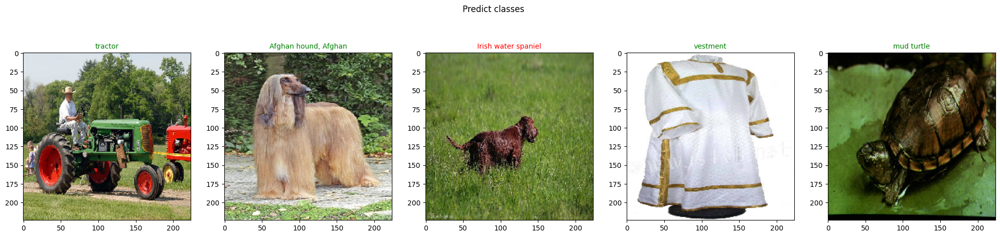

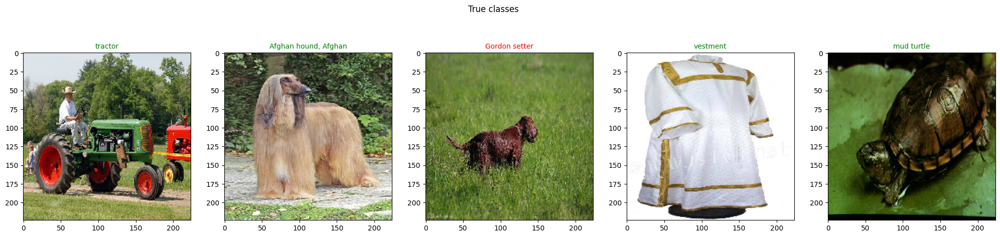

In [11]:
random_index = random.sample(range(0, classes), 5)

plt.figure(figsize=(25, 25))
plt.suptitle('Predict classes', x = 0.5, y = 0.6)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    ax.imshow(images_array[random_index[i]])
    if predict_classes[random_index[i]] == true_classes[random_index[i]]:
        plt.title(predict_classes[random_index[i]], color='green', size=10)
    else:
        plt.title(predict_classes[random_index[i]], color='red', size=10)
plt.figure(figsize=(25, 25))
plt.suptitle('True classes', x = 0.5, y = 0.6)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    ax.imshow(images_array[random_index[i]])
    if predict_classes[random_index[i]] == true_classes[random_index[i]]:
        plt.title(true_classes[random_index[i]], color='green', size=10)
    else:
        plt.title(true_classes[random_index[i]], color='red', size=10)

In [12]:
accuracy = 0
for i in range(classes):
    if predict_classes[i] == true_classes[i]:
        accuracy+=1
accuracy /= classes
print('accuracy : ' + str(accuracy))

accuracy : 0.792


#### *The training of model without any changes to the architecture shows that accuracy rate ***79%*** which is a little bit high but not enought for deploying so I am going to try model transfer learning and compare both sides.*  

# 2.Resnet with transfer learning 

 *Transfer learning with ResNet-50 involves taking a pre-trained ResNet-50 model (which has been trained on a large dataset, typically ImageNet) and fine-tuning it on a new dataset or task. Instead of training the model from scratch, transfer learning leverages the knowledge learned from the original task (e.g., ImageNet classification) and applies it to a new, possibly related task.*

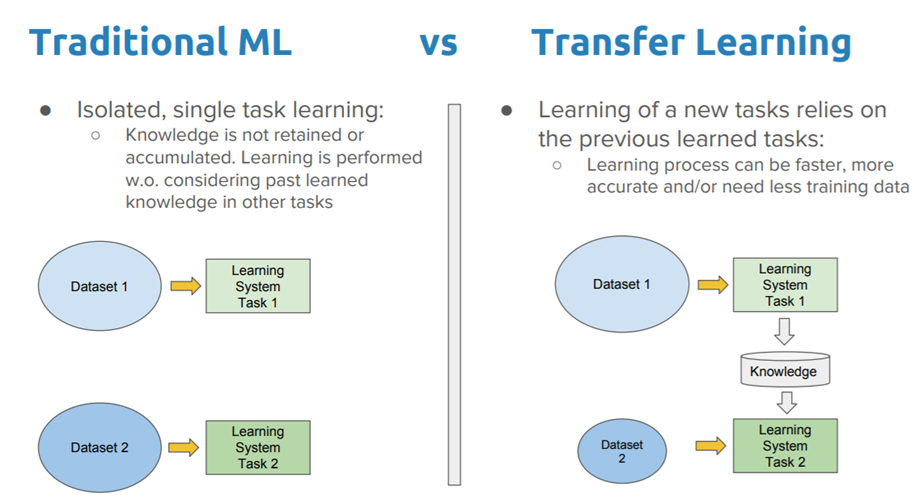

In [13]:
Resnet_tf_learn=ResNet50(weights='imagenet',include_top=False,input_shape=(224,224,3))
Resnet_tf_learn.summary()

94765736/94765736 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                          

In [15]:
for i in Resnet_tf_learn.layers:
    i.trainable=False
Resnet_tf_learn.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [54]:
class Resnet50(tf.keras.Model):
    def __init__(self):
        super(Resnet50,self).__init__()
        self.resnet = Resnet_tf_learn
        self.flatten1 = tf.keras.layers.Flatten()
        self.dense_1 = tf.keras.layers.Dense(2048,activation='relu',kernel_regularizer="l1")
        self.drop = tf.keras.layers.Dropout(0.2)
        self.dense_2 = tf.keras.layers.Dense(2048,activation='relu')
        self.dense_3 = tf.keras.layers.Dense(classes,activation='softmax')
    def call(self,x):
        x = self.resnet(x)
        x = self.flatten1(x)
        x = self.dense_1(x)
        x = self.drop(x)
        x = self.dense_2(x)
        return self.dense_3(x)
resnet_tf_learn = Resnet50()
resnet_tf_learn.build((None, 224, 224, 3))

In [55]:
Resnet_tf_learn.get_weights()

[array([[[[ 2.82526277e-02, -1.18737184e-02,  1.51488732e-03, ...,
           -1.07003953e-02, -5.27982824e-02, -1.36667420e-03],
          [ 5.86827798e-03,  5.04415408e-02,  3.46324709e-03, ...,
            1.01423981e-02,  1.39493728e-02,  1.67549420e-02],
          [-2.44090753e-03, -4.86173332e-02,  2.69966386e-03, ...,
           -3.44439060e-04,  3.48098315e-02,  6.28910400e-03]],
 
         [[ 1.81872323e-02, -7.20698107e-03,  4.80302610e-03, ...,
           -7.43396254e-03, -8.56800564e-03,  1.16849300e-02],
          [ 1.87554304e-02,  5.12730293e-02,  4.50406177e-03, ...,
            1.39413681e-02,  1.26296384e-02, -1.73004344e-02],
          [ 1.90453827e-02, -3.87909152e-02,  4.25842637e-03, ...,
            2.75742816e-04, -1.27962548e-02, -8.35626759e-03]],
 
         [[ 1.58849321e-02, -1.06073255e-02,  1.30999666e-02, ...,
           -2.26797583e-03, -3.98984266e-04,  3.39989027e-04],
          [ 3.61421369e-02,  5.02430499e-02,  1.22699486e-02, ...,
            1.199

In [56]:
print('Prediction in progress')
predictions_array_tr= resnet_tf_learn.predict(dataset_array[:classes])
print('Predicted')

predict_classes_tr = []

for i in tqdm(range(classes)):
    arg_max_tr = predictions_array_tr[i].argmax()
    predict_class_tr = class_mapping_dict_number[arg_max_tr]
    predict_classes_tr.append(predict_class_tr)
predict_classes_tr = np.array(predict_classes_tr)

Prediction in progress
32/32 [==============================] - 21s 613ms/step
Predicted


100%|██████████| 1000/1000 [00:00<00:00, 326125.81it/s]


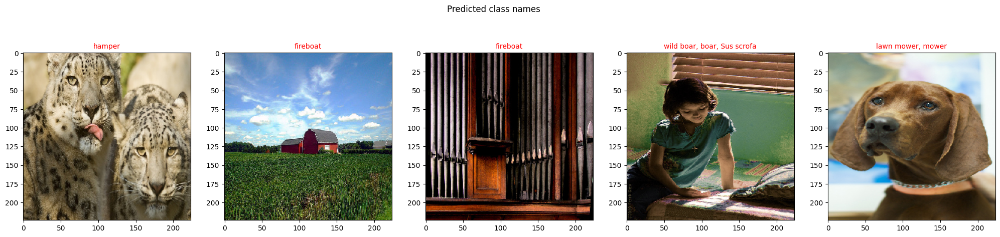

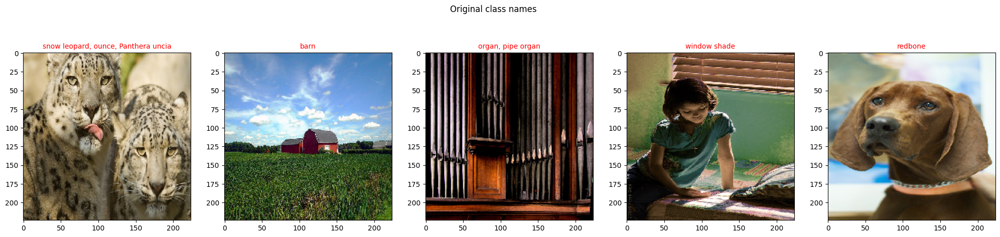

In [58]:
random_index = random.sample(range(0, classes), 5)

plt.figure(figsize=(25, 25))
plt.suptitle('Predicted class names', x = 0.5, y = 0.6)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    ax.imshow(images_array[random_index[i]])
    if predict_classes_tr[random_index[i]] == true_classes[random_index[i]]:
        plt.title(predict_classes_tr[random_index[i]], color='green', size=10)
    else:
        plt.title(predict_classes_tr[random_index[i]], color='red', size=10)
plt.figure(figsize=(25, 25))
plt.suptitle('Original class names', x = 0.5, y = 0.6)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    ax.imshow(images_array[random_index[i]])
    if predict_classes_tr[random_index[i]] == true_classes[random_index[i]]:
        plt.title(true_classes[random_index[i]], color='green', size=10)
    else:
        plt.title(true_classes[random_index[i]], color='red', size=10)

In [59]:
accuracy_tr = 0
for i in range(classes):
    if predict_classes_tr[i] == true_classes[i]:
        accuracy_tr+=1
accuracy_tr /= classes
print('accuracy : ' + str(accuracy_tr))

accuracy : 0.0


**Mission failed!**

**I have reviewed my model above and changed the output layers and their values  and checked the result about 15 times to get the maximum accuracy. But the result I got is too low.The wieghts of original pre-trained ResNet50 model and  the weights after applying transfer learning process are too different. There might be several resons :
1.The original pre-trained ResNet50 model might be well-suited for the ImageNet dataset due to its similarity to the dataset it was trained on. If the new task or dataset you're applying transfer learning to is significantly different from ImageNet, the features learned by the pre-trained model may not be as relevant or useful.
2.Transfer learning tends to perform best when the new dataset is small.The ImageNet dataset is large and diverse,there might not be as much benefit from transfer learning compared to training the model from scratch on the the dataset.** 

# 3.Fine-tuning model

In [32]:
resnet_fine_tuning = ResNet50(weights='imagenet',include_top=False,input_shape=(224,224,3))

In [33]:
for layer in resnet_fine_tuning.layers[-10:]:
    layer.trainable = True
resnet_fine_tuning.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [53]:
class My_model(tf.keras.Model):  # creating a model consists of the last convolutional and fully connected layers
    def __init__(self):
        super(My_model,self).__init__(name='ResNet_fine_tuning')
        self.resnet = resnet_fine_tuning
        self.aver_pool = tf.keras.layers.AveragePooling2D(pool_size=(7,7))
        self.flatten1 = tf.keras.layers.Flatten()
        self.dense_1 = tf.keras.layers.Dense(2048,activation='relu')
        self.dense_2 = tf.keras.layers.Dense(classes,activation='softmax')
    def call(self,x):
        x = self.resnet(x)
        x = self.aver_pool(x)
        x = self.flatten1(x)
        x = self.dense_1(x)
        return self.dense_2(x)
Resnet_fine_tuning = My_model()
Resnet_fine_tuning.build((None, 224, 224, 3))
Resnet_fine_tuning.summary()

Model: "ResNet_fine_tuning"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 average_pooling2d_9 (Averag  multiple                 0         
 ePooling2D)                                                     
                                                                 
 flatten_10 (Flatten)        multiple                  0         
                                                                 
 dense_20 (Dense)            multiple                  4196352   
                                                                 
 dense_21 (Dense)            multiple                  2049000   
                                                                 
Total params: 29,833,064
Trainable params: 10,711,016
Non-trainable params: 19,122,048
___________________________

In [50]:
Resnet_fine_tuning.get_weights()

[array([[[[ 2.82526277e-02, -1.18737184e-02,  1.51488732e-03, ...,
           -1.07003953e-02, -5.27982824e-02, -1.36667420e-03],
          [ 5.86827798e-03,  5.04415408e-02,  3.46324709e-03, ...,
            1.01423981e-02,  1.39493728e-02,  1.67549420e-02],
          [-2.44090753e-03, -4.86173332e-02,  2.69966386e-03, ...,
           -3.44439060e-04,  3.48098315e-02,  6.28910400e-03]],
 
         [[ 1.81872323e-02, -7.20698107e-03,  4.80302610e-03, ...,
           -7.43396254e-03, -8.56800564e-03,  1.16849300e-02],
          [ 1.87554304e-02,  5.12730293e-02,  4.50406177e-03, ...,
            1.39413681e-02,  1.26296384e-02, -1.73004344e-02],
          [ 1.90453827e-02, -3.87909152e-02,  4.25842637e-03, ...,
            2.75742816e-04, -1.27962548e-02, -8.35626759e-03]],
 
         [[ 1.58849321e-02, -1.06073255e-02,  1.30999666e-02, ...,
           -2.26797583e-03, -3.98984266e-04,  3.39989027e-04],
          [ 3.61421369e-02,  5.02430499e-02,  1.22699486e-02, ...,
            1.199

In [60]:
print('Prediction in progress')
predictions_array_ft= Resnet_fine_tuning.predict(dataset_array[:classes])
print('Predicted')

predict_classes_ft = []

for i in tqdm(range(classes)):
    arg_max_ft = predictions_array_ft[i].argmax()
    predict_class_ft = class_mapping_dict_number[arg_max_ft]
    predict_classes_ft.append(predict_class_ft)
predict_classes_ft = np.array(predict_classes_ft)

Prediction in progress
32/32 [==============================] - 20s 594ms/step
Predicted


100%|██████████| 1000/1000 [00:00<00:00, 375194.92it/s]


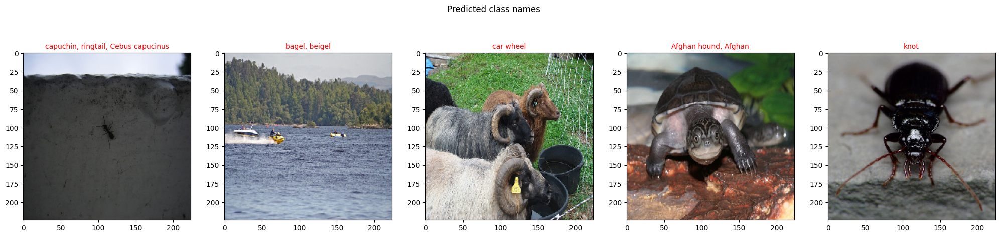

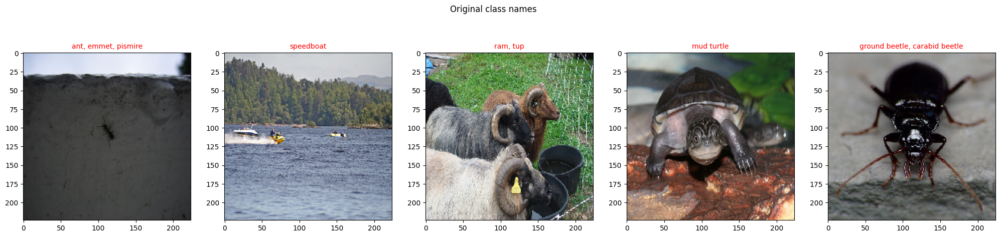

In [61]:
random_index = random.sample(range(0, classes), 5)

plt.figure(figsize=(25, 25))
plt.suptitle('Predicted class names', x = 0.5, y = 0.6)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    ax.imshow(images_array[random_index[i]])
    if predict_classes_ft[random_index[i]] == true_classes[random_index[i]]:
        plt.title(predict_classes_ft[random_index[i]], color='green', size=10)
    else:
        plt.title(predict_classes_ft[random_index[i]], color='red', size=10)
plt.figure(figsize=(25, 25))
plt.suptitle('Original class names', x = 0.5, y = 0.6)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    ax.imshow(images_array[random_index[i]])
    if predict_classes_ft[random_index[i]] == true_classes[random_index[i]]:
        plt.title(true_classes[random_index[i]], color='green', size=10)
    else:
        plt.title(true_classes[random_index[i]], color='red', size=10)

In [62]:
accuracy_ft = 0
for i in range(classes):
    if predict_classes_ft[i] == true_classes[i]:
        accuracy_ft+=1
accuracy_ft /= classes
print('accuracy : ' + str(accuracy_ft))

accuracy : 0.001


**Fine-tuning a model requires a substantial amount of data to adapt the pre-trained features to the new task. If the ImageNet data used for fine-tuning is limited or not representative of the entire dataset, the model may not generalize well to the original ImageNet data.**